<a href="https://colab.research.google.com/github/jpscard/I2A2_AI_Industry_Desafios/blob/main/Pump_sensor_data_EDA_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **1 - Importando as bibliotecas**

In [1]:
import os
from google.colab import drive
from google.colab import auth
from google.colab import files
import IPython
from IPython.display import Image
import pandas as pd
from pandas import read_csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar estilo seaborn para gráficos
sns.set_style('darkgrid')

## **2 - Importando e carregando o dataset**

### Opção 1: através do Google Drive

In [2]:
# Montar o Google Drive
drive.mount('/content/drive/')

# Autenticar o usuário
auth.authenticate_user()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Opção 2: Fazendo upload manualmente

In [3]:
# Fazer upload do arquivo (opcional)
uploaded = files.upload()

### Carregar dataset

In [4]:
# Carregar o dataset
df = pd.read_csv('/content/drive/MyDrive/dataset pump/sensor.csv')

## **3 - Avaliação inicial e limpeza de dados**

### **3.1 Exibindo informações iniciais**

In [5]:
# Para exibir as 5 primeiras linhas do dataframe
df.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [6]:
# Para contar a quantidade de ocorrências de cada valor na coluna 'machine_status'
df['machine_status'].value_counts()

NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

In [7]:
# Encontrar o número de dias em que os dados foram coletados
df.index.max() - df.index.min()

220319

In [8]:
# Informação sobre o formato do dataframe
df.shape

(220320, 55)

In [9]:
# Exibir um resumo das informações do dataframe, como número de linhas, colunas, tipos de dados, uso de memória, etc.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   timestamp       220320 non-null  object 
 2   sensor_00       210112 non-null  float64
 3   sensor_01       219951 non-null  float64
 4   sensor_02       220301 non-null  float64
 5   sensor_03       220301 non-null  float64
 6   sensor_04       220301 non-null  float64
 7   sensor_05       220301 non-null  float64
 8   sensor_06       215522 non-null  float64
 9   sensor_07       214869 non-null  float64
 10  sensor_08       215213 non-null  float64
 11  sensor_09       215725 non-null  float64
 12  sensor_10       220301 non-null  float64
 13  sensor_11       220301 non-null  float64
 14  sensor_12       220301 non-null  float64
 15  sensor_13       220301 non-null  float64
 16  sensor_14       220299 non-null  float64
 17  sensor_15 

### **3.2 Excluindo colunas com valores nulos ou NaN, além da inicial**

In [10]:
# Verificar se há valores NaN (not a number)
missing_count= df.isnull().sum() # Para contabilizar valores nulos
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Para indicar o percentual de valores nulos
missing_df= pd.DataFrame({"Quantidade": missing_count, "Percentual": missing_percentage})
print(missing_df)

                Quantidade  Percentual
Unnamed: 0               0         0.0
timestamp                0         0.0
sensor_00            10208         4.6
sensor_01              369         0.2
sensor_02               19         0.0
sensor_03               19         0.0
sensor_04               19         0.0
sensor_05               19         0.0
sensor_06             4798         2.2
sensor_07             5451         2.5
sensor_08             5107         2.3
sensor_09             4595         2.1
sensor_10               19         0.0
sensor_11               19         0.0
sensor_12               19         0.0
sensor_13               19         0.0
sensor_14               21         0.0
sensor_15           220320       100.0
sensor_16               31         0.0
sensor_17               46         0.0
sensor_18               46         0.0
sensor_19               16         0.0
sensor_20               16         0.0
sensor_21               16         0.0
sensor_22               4

In [11]:
# Descartar coluna do sensor_50, sensor_51 e sensor_00 por apresentarem muitos valores NaN, e possuir porcentagem de nulos muito maiores que 2%
df.drop(columns=['Unnamed: 0','sensor_15','sensor_50','sensor_51','sensor_00'],inplace=True)

In [12]:
# Verificar se há valores NaN (not a number)
missing_count= df.isnull().sum() # Exibe a quantidade de valores nulos 
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Exibe o percentual de valores nulos
missing_df= pd.DataFrame({"Quantidade": missing_count, "Percentual": missing_percentage})
print(missing_df)

                Quantidade  Percentual
timestamp                0         0.0
sensor_01              369         0.2
sensor_02               19         0.0
sensor_03               19         0.0
sensor_04               19         0.0
sensor_05               19         0.0
sensor_06             4798         2.2
sensor_07             5451         2.5
sensor_08             5107         2.3
sensor_09             4595         2.1
sensor_10               19         0.0
sensor_11               19         0.0
sensor_12               19         0.0
sensor_13               19         0.0
sensor_14               21         0.0
sensor_16               31         0.0
sensor_17               46         0.0
sensor_18               46         0.0
sensor_19               16         0.0
sensor_20               16         0.0
sensor_21               16         0.0
sensor_22               41         0.0
sensor_23               16         0.0
sensor_24               16         0.0
sensor_25               3

### **3.3 Conversões de dados**

In [13]:
# Converter timestamp para um objeto DatetimeIndex, que é necessário para análise de séries temporais em pandas
df.timestamp=pd.to_datetime(df.timestamp)

In [14]:
# Converter coluna machine_status para dado do tipo categorico Isso ajudará a reduzir o tamanho do dataframe e a acelerar as operações de análise, pois as colunas categóricas são armazenadas internamente como inteiros, em vez de strings.
df.machine_status=df.machine_status.astype('category')

In [15]:
# Transformar timestamp para o indice. Essa transformação é necessária quando você deseja realizar uma análise de séries temporais, pois ela fornece uma maneira fácil de acessar e manipular dados com base em uma escala de tempo
df.set_index('timestamp',inplace=True)

In [16]:
# Verificar se não há duplicação no indice. Essa verificação é importante porque, em uma análise de séries temporais, é essencial que os índices não contenham duplicatas, pois isso pode levar a problemas como perda de dados e imprecisão em cálculos de estatísticas descritivas e outras métricas
df.index.is_unique

True

 *Os dados iniciais mostram que existem 52 sensores (um por cada coluna) que registraram dados a cada 1 minuto. Possuindo 220320 registros, com isso, o presente conjunto de dados representa um período de 153 dias. Além disso, as medições têm escalas diferentes.*

 *Foi realizado uma limpeza na tabela inicial, além do indice inicial "Unnamed: 0" a eliminação de sensores que possuiam um percentual bem maior que 2% de dados faltantes ou valores NaN(not a number), especificamente, os sensores: sensor_00, sensor_15, sensor_50 e sensor_51.*

## **4 - Análise exploratória de dados**

### 4.1 - Criação de coluna de inteiro para equiparar classes categóricas

In [17]:
# Transformar machine_status de string para tipo inteiro 
conditions = [(df['machine_status'] == 'NORMAL'), 
              (df['machine_status'] == 'BROKEN'), 
              (df['machine_status'] == 'RECOVERING')]
choices = [1, 0, 2] # Existem três condições possíveis
df['Operation'] = np.select(conditions, choices, default=0)

In [18]:
# Estatística básica do dataset
df.describe()

,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,Operation
count,219951.000000,220301.000000,220301.000000,220301.000000,220301.000000,215522.000000,214869.000000,215213.000000,215725.000000,220301.000000,...,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220320.000000
mean,47.591611,50.867392,43.752481,590.673936,73.396414,13.501537,15.843152,15.200721,14.799210,41.470339,...,35.365126,35.453455,43.879591,42.656877,43.094984,48.018585,44.340903,150.889044,57.119968,1.065677
std,3.296666,3.666820,2.418887,144.023912,17.298247,2.163736,2.201155,2.037390,2.091963,12.093519,...,7.898665,10.259521,11.044404,11.576355,12.837520,15.641284,10.442437,82.244957,19.143598,0.247846
min,0.000000,33.159720,31.640620,2.798032,0.000000,0.014468,0.000000,0.028935,0.000000,0.000000,...,20.833330,22.135416,24.479166,25.752316,26.331018,26.331018,27.199070,26.331018,26.620370,0.000000
25%,46.310760,50.390620,42.838539,626.620400,69.976260,13.346350,15.907120,15.183740,15.053530,40.705260,...,32.552080,32.812500,39.583330,36.747684,36.747684,40.509258,39.062500,83.912030,47.743060,1.000000
50%,48.133678,51.649300,44.227428,632.638916,75.576790,13.642940,16.167530,15.494790,15.082470,44.291340,...,34.895832,35.156250,42.968750,40.509260,40.219910,44.849540,42.534720,138.020800,52.662040,1.000000
75%,49.479160,52.777770,45.312500,637.615723,80.912150,14.539930,16.427950,15.697340,15.118630,47.463760,...,37.760410,36.979164,46.614580,45.138890,44.849540,51.215280,46.585650,208.333300,60.763890,1.000000
max,56.727430,56.032990,48.220490,800.000000,99.999880,22.251160,23.596640,24.348960,25.000000,76.106860,...,420.312500,374.218800,408.593700,1000.000000,320.312500,370.370400,303.530100,561.632000,464.409700,2.000000


### 4.2 - Seleção de colunas para plotagem

In [19]:
# Pegar colunas e linhas de interesse para plotar
sensor_cols = df.iloc[:,1:49]
broken_rows = df[df['machine_status']=='BROKEN']
recovery_rows = df[df['machine_status']=='RECOVERING']
normal_rows = df[df['machine_status']=='NORMAL']
machine_status_col = df['machine_status']

### 4.3 - Plotagem de gráficos de barra e de pizza

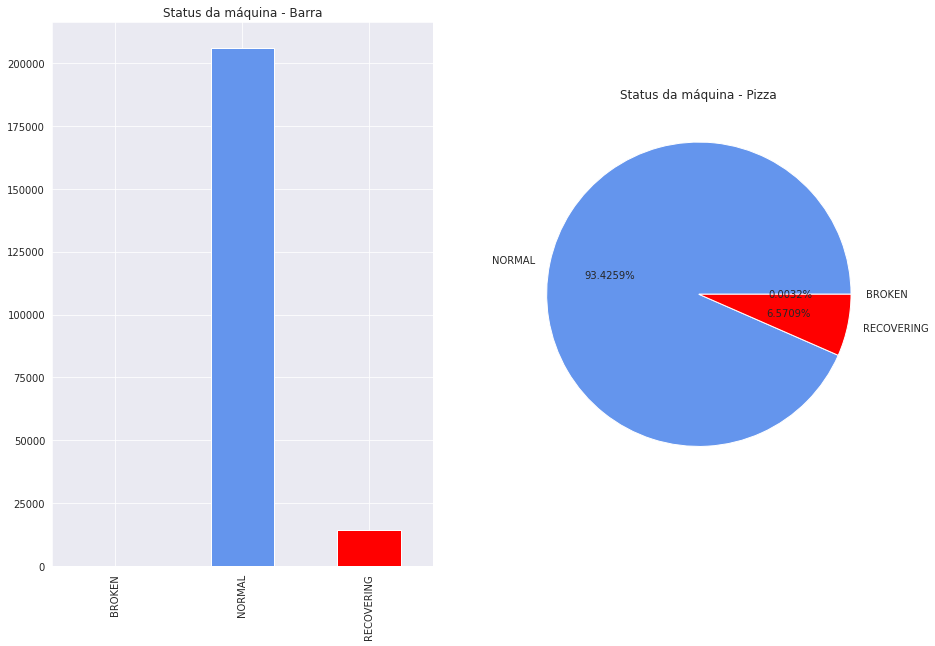

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,10))
df.groupby('machine_status').size().plot(kind='bar', ax=ax1, color=['black', 'cornflowerblue', 'red'])
df.groupby('machine_status').size().plot(kind='pie', ax=ax2, autopct='%.4f%%', colors=['black', 'cornflowerblue', 'red'])
ax1.set_title('Status da máquina - Barra')
ax1.set_xlabel('')
ax2.set_title('Status da máquina - Pizza')
ax2.set_ylabel('')
plt.show()

### 4.4 - Plotagem de gráficos de linha

array([<AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabe

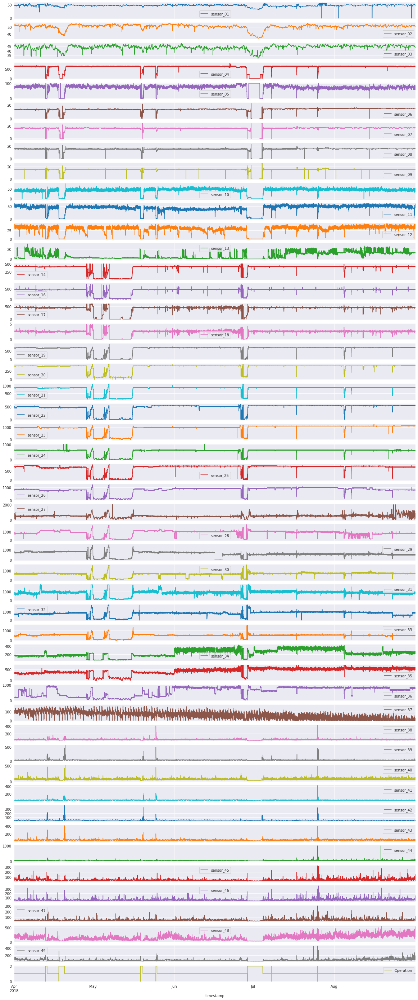

In [21]:
# Plotando os sensores
status = [(df['machine_status'] == 'NORMAL'), (df['machine_status'] == 'BROKEN'), (df['machine_status'] == 'RECOVERING')]
label_encoding = [1, 0, 2]
df['Operation'] = np.select(status, choices, default=0)
df.plot(subplots=True, sharex=True, figsize=(20, 50))

*Como pode ser visto, existem padrões de sinais sendo capturados pelos os respectivos grupos de sensores:*

*   *(1,2,3)*
*   *(4,5,6,7,8,9)*
*   *(10,11,12)*
*   *(14,16,17,18)*
*   *(19,20,21,22,23,24)*
*   *(25,26,28,29,30,31,32,33)*
*   *(34,35)*
*   *(38,39,40,41,42,43,45,46,47)* 

*Por sua vez, há sinais que são muito ruidosos e parecem não seguir nenhuma tendência em particular.*

### 4.5 - Nova avaliação do dataframe para eliminar todos os valores nulos existentes

In [22]:
# utilizando método para preenchimento de dados faltantes
df.fillna(method = 'ffill' , inplace = True)

In [23]:
# Verificando novamente os valores ausentes para garantir
missing_count= df.isnull().sum() # count the number of missing values
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Percentual de valores faltantes
missing_df= pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
print(missing_df)

                count  percentage
sensor_01           0         0.0
sensor_02           0         0.0
sensor_03           0         0.0
sensor_04           0         0.0
sensor_05           0         0.0
sensor_06           0         0.0
sensor_07           0         0.0
sensor_08           0         0.0
sensor_09           0         0.0
sensor_10           0         0.0
sensor_11           0         0.0
sensor_12           0         0.0
sensor_13           0         0.0
sensor_14           0         0.0
sensor_16           0         0.0
sensor_17           0         0.0
sensor_18           0         0.0
sensor_19           0         0.0
sensor_20           0         0.0
sensor_21           0         0.0
sensor_22           0         0.0
sensor_23           0         0.0
sensor_24           0         0.0
sensor_25           0         0.0
sensor_26           0         0.0
sensor_27           0         0.0
sensor_28           0         0.0
sensor_29           0         0.0
sensor_30     

In [24]:
# verificando se os status não são todos do mesmo valor
df.machine_status.unique() 

['NORMAL', 'BROKEN', 'RECOVERING']
Categories (3, object): ['BROKEN', 'NORMAL', 'RECOVERING']

In [25]:
# Analisando uma estatística básica novamente
df.describe()

,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,Operation
count,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,...,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000,220320.000000
mean,47.597254,50.867093,43.752337,590.664106,73.394872,13.209623,15.498316,14.872618,14.491819,41.469733,...,35.364745,35.453143,43.879263,42.656415,43.094291,48.017908,44.340380,150.886798,57.119821,1.065677
std,3.302558,3.667314,2.418979,144.042134,17.301042,2.901954,3.152707,2.956980,2.956122,12.094658,...,7.898342,10.258958,11.043951,11.575867,12.836955,15.640575,10.441987,82.243950,19.143759,0.247846
min,0.000000,33.159720,31.640620,2.798032,0.000000,0.014468,0.000000,0.028935,0.000000,0.000000,...,20.833330,22.135416,24.479166,25.752316,26.331018,26.331018,27.199070,26.331018,26.620370,0.000000
25%,46.310760,50.390620,42.838539,626.620400,69.976258,13.317420,15.856480,15.147570,15.010130,40.704892,...,32.552080,32.812500,39.583330,36.747684,36.747684,40.509258,39.062500,83.912030,47.743060,1.000000
50%,48.133680,51.649300,44.227428,632.638916,75.576430,13.628470,16.167530,15.451390,15.082470,44.291375,...,34.895832,35.156250,42.968750,40.509260,40.219910,44.849540,42.245370,138.020800,52.662040,1.000000
75%,49.479160,52.777770,45.312500,637.615723,80.911770,14.539930,16.427950,15.697340,15.118630,47.464360,...,37.760410,36.979164,46.614580,45.138890,44.849540,51.215280,46.585650,208.333300,60.763890,1.000000
max,56.727430,56.032990,48.220490,800.000000,99.999880,22.251160,23.596640,24.348960,25.000000,76.106860,...,420.312500,374.218800,408.593700,1000.000000,320.312500,370.370400,303.530100,561.632000,464.409700,2.000000


In [26]:
# Verificando o dataframe novamente
df.head()

,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,machine_status,Operation
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,NORMAL,1
2018-04-01 00:01:00,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,NORMAL,1
2018-04-01 00:02:00,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,37.86777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,NORMAL,1
2018-04-01 00:03:00,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,38.57977,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,NORMAL,1
2018-04-01 00:04:00,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,39.48939,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,NORMAL,1


## **5 - Relatório com Pandas Profiling**
[Um breve tutorial sobre a biblioteca Pandas Profiling](https://www.youtube.com/watch?v=Z3t7lnjqzpY)

### **5.1 Instalação**

In [27]:
# Instalação
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
# Importação
from ydata_profiling import ProfileReport

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


### **5.2 Análise**

In [28]:
# Análise com Pofiling
# profile = ProfileReport(df, title='Machine Status Data', explorative=True) # mais completa, pode travar no colab
profile = ProfileReport(df, title='Relatório de Status de Máquina', minimal=True) # análise mínima
profile.to_file(output_file="Relatório Profiling.html") # Para exportar página html, visualize no colab
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## **6 - Relatório com Sweetviz**
[Um breve tutorial sobre a biblioteca Pandas Profiling](https://www.youtube.com/watch?v=UR_OK8vBpeY&t=398s)

### **6.1 Instalação e importação de biblioteca**

In [29]:
# Instalação
!pip install sweetviz
# Importação
import sweetviz as sv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### **5.1 Análise**

In [30]:
analyze_report = sv.analyze(df)
analyze_report.show_html('Relatório Sweetviz.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report Relatório Sweetviz.html was generated.



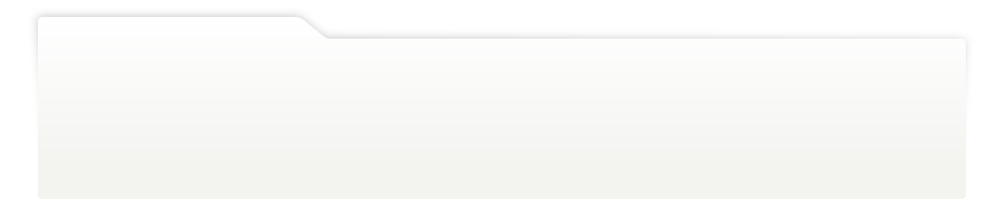
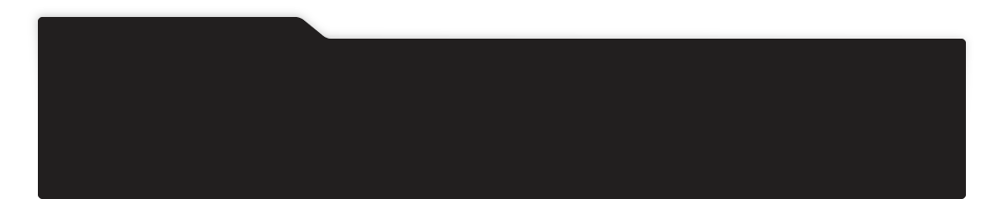
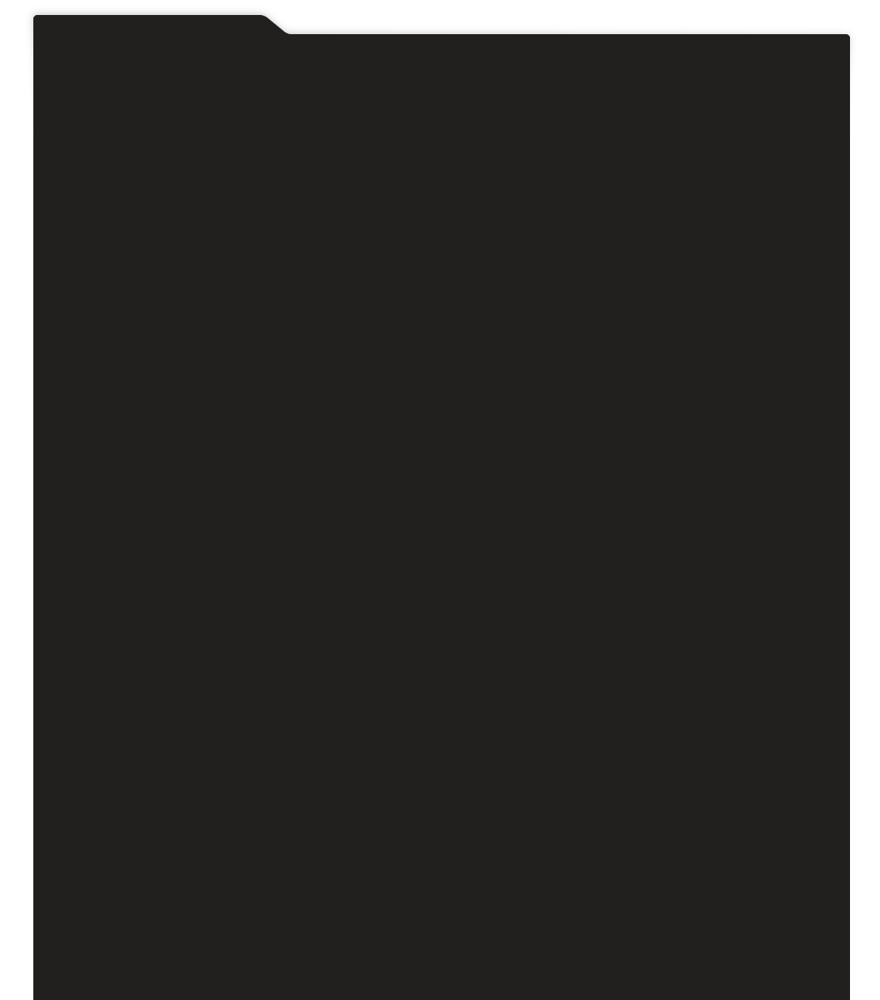
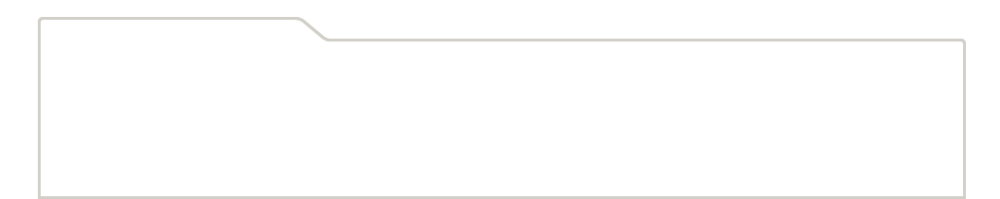
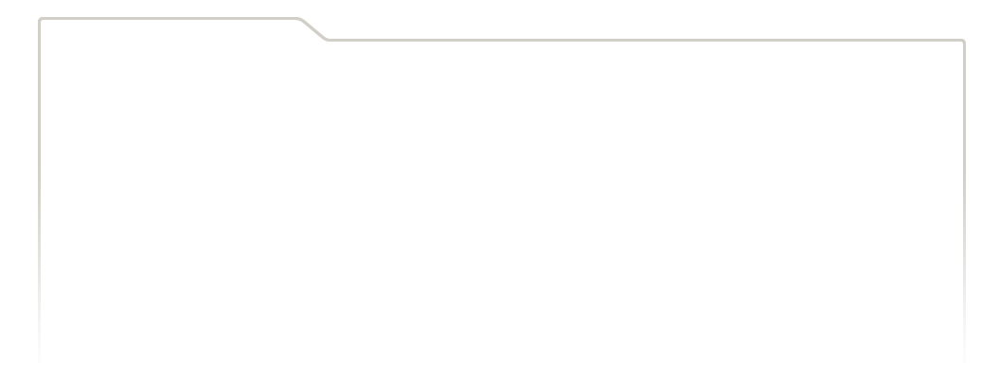
...
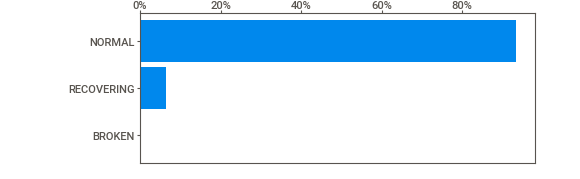
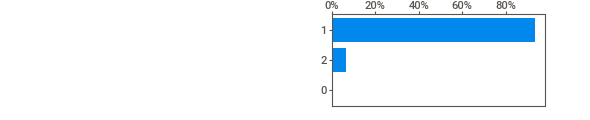
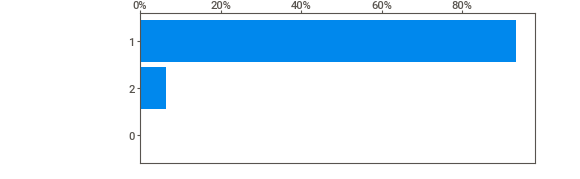
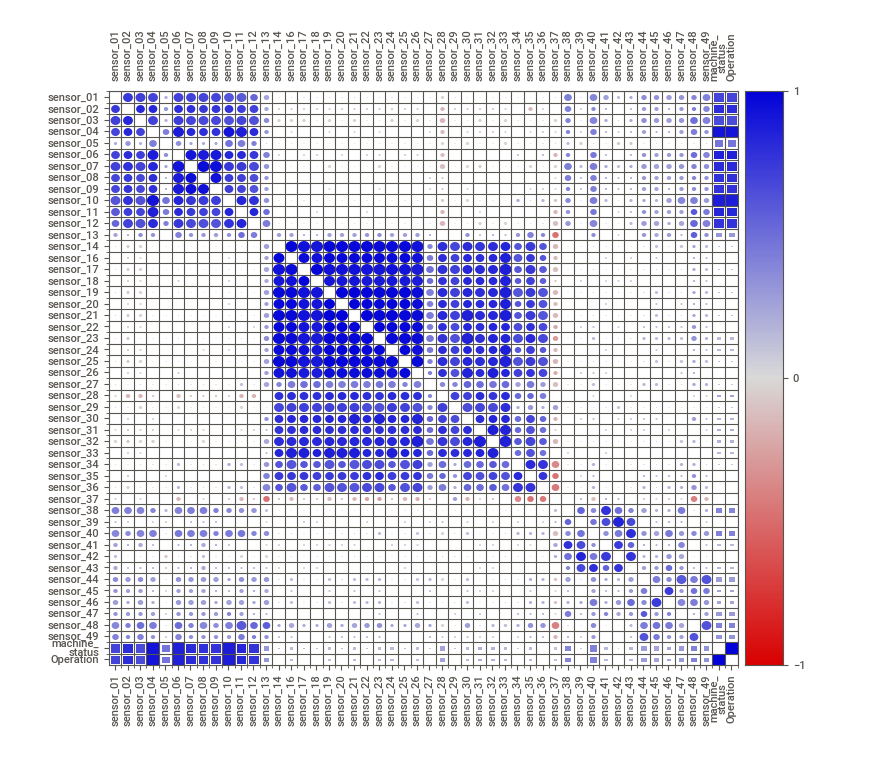
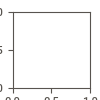

In [31]:
# Visualizar relatório
IPython.display.HTML('Relatório Sweetviz.html')

## **7 - Considerações finais**

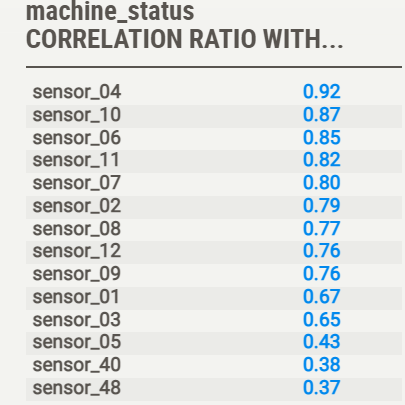

### *Com base no levantamento exploratório dos dados, encontra-se o grau de correlação entre as classes de status da máquina e os sensores. Sendo possível assim, determinar quais sensores possuem maior relevância para determinar o estado de operação da máquina, e assim, viabilizando uma melhor abordagem para monitoramento preditivo de falhas.*